# CISC3014 project
# Predicting market price

## Preparing packages

In [29]:
pip install dash

Note: you may need to restart the kernel to use updated packages.


In [30]:
pip install yfinance   # use yahoo finance as dataReader

Note: you may need to restart the kernel to use updated packages.


ERROR: Invalid requirement: '#'


In [31]:
pip install pandas_datareader

Note: you may need to restart the kernel to use updated packages.


## Import dictionary

In [32]:
import numpy as np
import pandas as pd
pd.core.common.is_list_like = pd.api.types.is_list_like
import pandas_datareader as web

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use('fivethirtyeight')
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected = True)
%matplotlib inline

from pandas_datareader.data import DataReader
import yfinance as yf

from datetime import datetime

## Set goal: The top 10 biggest companies in the US (updated to NASDAQ 8/10/2022)

In [33]:
tech_list = ['AAPL', 'MSFT', 'GOOG',  'AMZN', 'V']

end = datetime.now()
start = datetime(2000, 1, 1)

for stock in tech_list:
    globals()[stock] = yf.download(stock, start, end)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [34]:
company_list = [AAPL, MSFT, GOOG, AMZN, V]
company_name = ['APPLE', 'MICROSOFT', 'GOOGLE', 'AMAZON', 'VISA']

for company, com_name in zip(company_list, company_name):
    company['company_name'] = com_name
    
df = pd.concat(company_list, axis = 0)
df

,Open,High,Low,Close,Adj Close,Volume,company_name
Date,,,,,,,
2000-01-03,0.936384,1.004464,0.907924,0.999442,0.847207,535796800,APPLE
2000-01-04,0.966518,0.987723,0.903460,0.915179,0.775779,512377600,APPLE
2000-01-05,0.926339,0.987165,0.919643,0.928571,0.787131,778321600,APPLE
2000-01-06,0.947545,0.955357,0.848214,0.848214,0.719014,767972800,APPLE
2000-01-07,0.861607,0.901786,0.852679,0.888393,0.753073,460734400,APPLE
...,...,...,...,...,...,...,...
2023-11-20,249.610001,250.929993,245.600006,249.970001,249.970001,8604200,VISA
2023-11-21,250.029999,253.339996,250.029999,252.229996,252.229996,7213700,VISA
2023-11-22,253.000000,254.539993,252.660004,253.720001,253.720001,5701400,VISA


## **Historical view of the closing price**

In [35]:
fig = px.area(df, facet_col = 'company_name', x = df.index, y = 'Close', facet_col_wrap = 3, color = 'company_name', template = 'plotly_dark')
fig.show()

## **Sales volume per stock**

In [36]:
fig = px.area(df, facet_col = 'company_name', x = df.index, y = 'Volume', facet_col_wrap = 5, color = 'company_name', template = 'plotly_dark')
fig.show()

## **Daily return**

In [37]:
df['Daily Return'] = df['Adj Close'].pct_change()

In [38]:
fig = px.line(df, facet_col = 'company_name', x = df.index, y = 'Daily Return', facet_col_wrap = 3, color = 'company_name', template = 'plotly_dark')
fig.show()

In [39]:
fig = px.histogram(df, x = 'company_name', y = 'Daily Return', color = 'company_name', template = 'plotly_dark')
fig.show()

## **Correlations between stocks**

In [45]:
tech_list = ['AAPL', 'MSFT', 'GOOG',  'AMZN', 'V']

end = datetime.now()
start = datetime(2000, 1, 1)

closing_df = pd.DataFrame()

# Fetch the data for each symbol and concatenate it to the DataFrame
for symbol in tech_list:
    df = yf.download(symbol, start=start, end=end)['Adj Close']
    closing_df[symbol] = df
closing_df.head()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,AAPL,MSFT,GOOG,AMZN,V
Date,,,,,
2000-01-03,0.847207,36.132263,NaN,4.468750,NaN
2000-01-04,0.775779,34.911697,NaN,4.096875,NaN
2000-01-05,0.787131,35.279812,NaN,3.487500,NaN
2000-01-06,0.719014,34.098011,NaN,3.278125,NaN
2000-01-07,0.753073,34.543598,NaN,3.478125,NaN


In [46]:
daily = closing_df.pct_change()
daily.head()

,AAPL,MSFT,GOOG,AMZN,V
Date,,,,,
2000-01-03,NaN,NaN,NaN,NaN,NaN
2000-01-04,-0.084310,-0.033780,NaN,-0.083217,NaN
2000-01-05,0.014633,0.010544,NaN,-0.148741,NaN
2000-01-06,-0.086538,-0.033498,NaN,-0.060036,NaN
2000-01-07,0.047369,0.013068,NaN,0.061010,NaN


In [48]:
fig = px.scatter(daily, x = 'V', y = 'V', marginal_x = 'histogram', marginal_y = 'histogram', template = 'plotly_dark', trendline = 'ols')
fig.show()

##### **Obviously, there is linearity between Visa and itself.**

In [49]:
fig = px.scatter(daily, x = 'AAPL', y = 'V', marginal_x = 'histogram', marginal_y = 'histogram', template = 'plotly_dark', trendline = 'ols')
fig.show()

##### **There is a weak and positive correlation between Apple and Visa.**

In [50]:
fig = px.scatter(daily, x = 'AAPL', y = 'MSFT', marginal_x = 'histogram', marginal_y = 'histogram', template = 'plotly_dark', trendline = 'ols')
fig.show()

##### **There is a weak positive correlation between Apple and Microsoft**

In [51]:
fig = px.scatter_matrix(daily, template = 'plotly_dark')
fig.show()

<Axes: >

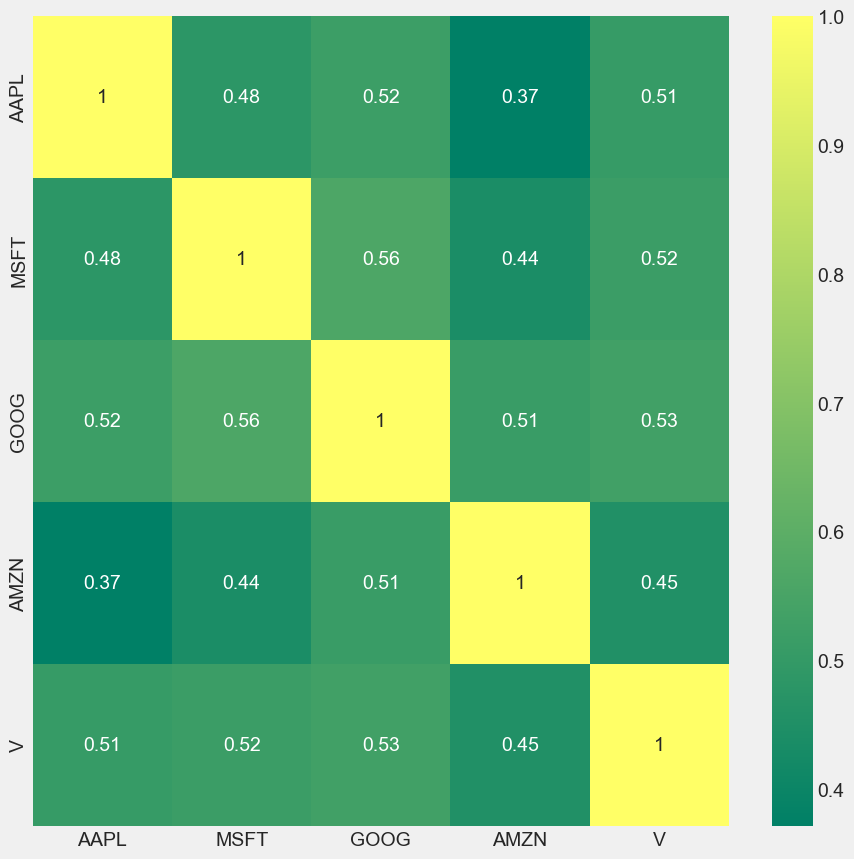

In [52]:
plt.figure(figsize = (10, 10))
sns.heatmap(daily.corr(), annot = True, cmap = 'summer')

##### **The highest correlation to daily returns is between Google and Microsoft, i.e. there is a weak positive correlation of 0.55**

## **Risk and return**

In [53]:
risk = daily.dropna()

In [54]:
area = np.pi * 20

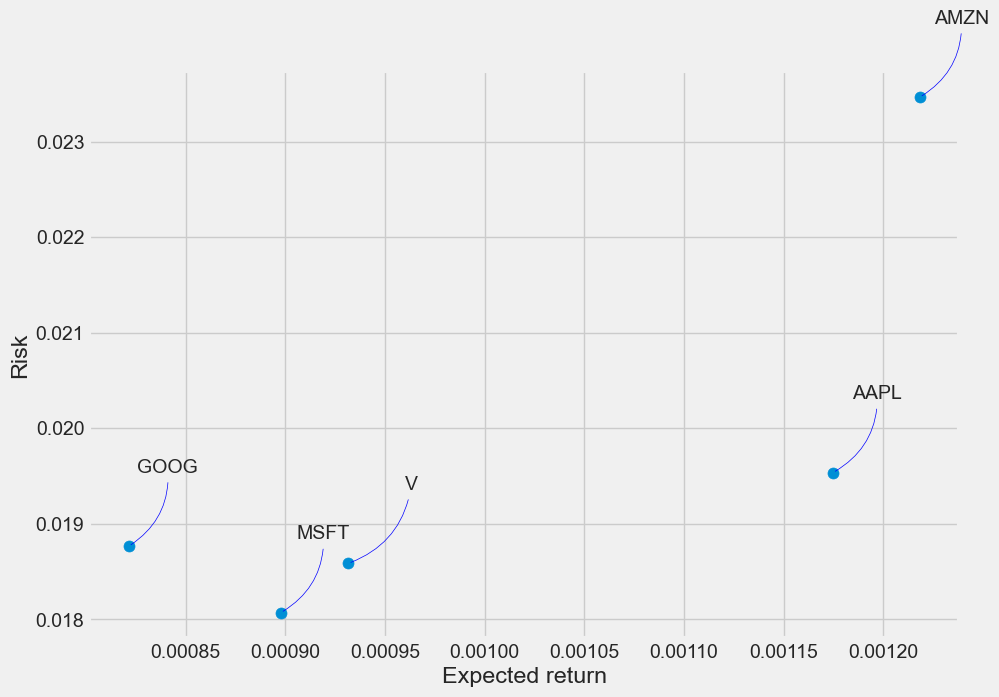

In [55]:
plt.figure(figsize=(10, 7))
plt.scatter(risk.mean(), risk.std(), s=area)
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(risk.columns, risk.mean(), risk.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

##### **Netflix has a high return but a high risk, while Apple has a high return for a moderate risk, so it would be worth investing in Apple if you have the moderate profile.**

## **Predicting AAPL's closing price**

In [58]:
df2 = yf.download('AAPL', start, end)
df2

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2000-01-03,0.936384,1.004464,0.907924,0.999442,0.847207,535796800
2000-01-04,0.966518,0.987723,0.903460,0.915179,0.775779,512377600
2000-01-05,0.926339,0.987165,0.919643,0.928571,0.787131,778321600
2000-01-06,0.947545,0.955357,0.848214,0.848214,0.719014,767972800
2000-01-07,0.861607,0.901786,0.852679,0.888393,0.753073,460734400
...,...,...,...,...,...,...
2023-11-17,190.250000,190.380005,188.570007,189.690002,189.690002,50922700
2023-11-20,189.889999,191.910004,189.880005,191.449997,191.449997,46505100
2023-11-21,191.410004,191.520004,189.740005,190.639999,190.639999,38134500


## Method (OHLC)

In [59]:
fig = go.Figure(data=[go.Candlestick(x=df2.index,
                open=df2['Open'],
                high=df2['High'],
                low=df2['Low'],
                close=df2['Close'])])

fig.show()

## Training/testing spliting
### Training/Testing ratio: 8:2

In [60]:
data = df2.filter(['Close'])
dataset = data.values
training_data_len = int(np.ceil( len(dataset) * .80 ))
training_data_len


4811

## Data Preporcessing

In [61]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

scaled_data

array([[0.00389957],
       [0.00347012],
       [0.00353838],
       ...,
       [0.97038974],
       [0.97380434],
       [0.96697514]])

In [62]:
train_data = scaled_data[0:int(training_data_len), :]

x_train = []
y_train = []

for i in range(60, len(train_data)):
    x_train.append(train_data[i-60:i, 0])
    y_train.append(train_data[i, 0])
    if i<= 61:
        print(x_train)
        print(y_train)
        print()
        
x_train, y_train = np.array(x_train), np.array(y_train)

x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))    # data reshaping

[array([0.00389957, 0.00347012, 0.00353838, 0.00312884, 0.00333361,
       0.00325398, 0.00302646, 0.00277335, 0.00320847, 0.00337627,
       0.00353553, 0.00365498, 0.00397067, 0.00387113, 0.00364076,
       0.00391378, 0.00381993, 0.0038114 , 0.00343031, 0.003527  ,
       0.00336774, 0.00330232, 0.00350709, 0.0037204 , 0.00399626,
       0.00403323, 0.00393085, 0.00397067, 0.00375452, 0.00407589,
       0.00422094, 0.0039991 , 0.00403323, 0.00386828, 0.00398488,
       0.0040958 , 0.00404816, 0.00382847, 0.00395929, 0.00402186,
       0.0047357 , 0.00435745, 0.00463047, 0.00452524, 0.00439726,
       0.00435745, 0.00436882, 0.00452809, 0.00432616, 0.00400479,
       0.0040958 , 0.00433754, 0.00449396, 0.00440295, 0.00494615,
       0.00536706, 0.00523624, 0.00511679, 0.00515661, 0.0051367 ])]
[0.004991659184319]

[array([0.00389957, 0.00347012, 0.00353838, 0.00312884, 0.00333361,
       0.00325398, 0.00302646, 0.00277335, 0.00320847, 0.00337627,
       0.00353553, 0.00365498, 0.0039

In [63]:
from keras.models import Sequential
from keras.layers import Dense, LSTM

# Build the LSTM model
model = Sequential()
model.add(LSTM(128, return_sequences=True, input_shape= (x_train.shape[1], 1)))
model.add(LSTM(64, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(x_train, y_train, batch_size=1, epochs=10)

Epoch 1/10
4751/4751 [==============================] - 60s 12ms/step - loss: 8.6828e-05
Epoch 2/10
4751/4751 [==============================] - 58s 12ms/step - loss: 3.4139e-05
Epoch 3/10
4751/4751 [==============================] - 60s 13ms/step - loss: 2.5408e-05
Epoch 4/10
4751/4751 [==============================] - 59s 12ms/step - loss: 2.0097e-05
Epoch 5/10
4751/4751 [==============================] - 59s 12ms/step - loss: 1.6164e-05
Epoch 6/10
4751/4751 [==============================] - 59s 12ms/step - loss: 1.3755e-05
Epoch 7/10
4751/4751 [==============================] - 59s 12ms/step - loss: 1.2414e-05
Epoch 8/10
4751/4751 [==============================] - 59s 12ms/step - loss: 1.2265e-05
Epoch 9/10
4751/4751 [==============================] - 59s 12ms/step - loss: 1.2709e-05
Epoch 10/10
4751/4751 [==============================] - 59s 12ms/step - loss: 1.2744e-05


In [64]:
# Create the testing data set
# Create a new array containing scaled values from index 1543 to 2002 
test_data = scaled_data[training_data_len - 60: , :]
# Create the data sets x_test and y_test
x_test = []
y_test = dataset[training_data_len:, :]
for i in range(60, len(test_data)):
    x_test.append(test_data[i-60:i, 0])
    
# Convert the data to a numpy array
x_test = np.array(x_test)

# Reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1 ))

# Get the models predicted price values 
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

# Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))
rmse

38/38 [==============================] - 1s 12ms/step


14.385912821621961

# Validation set

In [65]:
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions

C:\Users\SGranaturov\AppData\Local\Temp\ipykernel_16348\2657761684.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



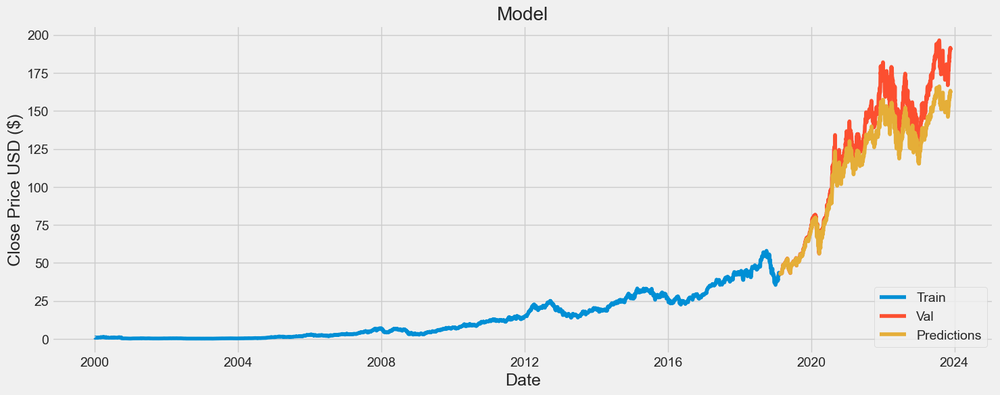

In [66]:
plt.figure(figsize=(16,6))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
plt.show()

In [67]:
valid

,Close,Predictions
Date,,
2019-02-19,42.732498,42.591141
2019-02-20,43.007500,42.751823
2019-02-21,42.764999,43.009178
2019-02-22,43.242500,42.752602
2019-02-25,43.557499,43.283882
...,...,...
2023-11-17,189.690002,162.167648
2023-11-20,191.449997,161.833466
2023-11-21,190.639999,163.310638


In [70]:
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor(hidden_layer_sizes=(64, 32), max_iter=100, random_state=42)
mlp.fit(x_train, y_train)


ValueError: Found array with dim 3. MLPRegressor expected <= 2.

In [73]:
X_train_2D = x_train.reshape(x_train.shape[0], -1)
X_test_2D = x_test.reshape(x_test.shape[0], -1)

In [80]:
from sklearn.metrics import mean_squared_error
mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
mlp.fit(X_train_2D, y_train)

y_pred = mlp.predict(X_test_2D)

mse = mean_squared_error(y_test, y_pred)

print(mse)

17115.763865183246


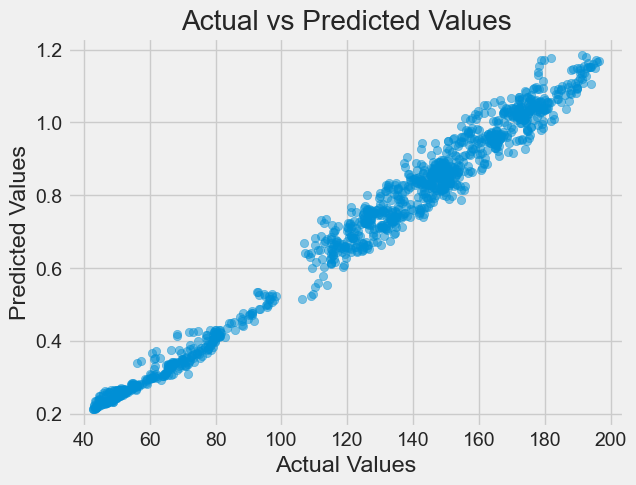

In [86]:
plt.scatter(y_test, y_pred, alpha=0.5)

plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()